In [49]:
# Run this for Google CoLab (use TensorFlow 1.x)
%tensorflow_version 1.x
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [50]:
!git clone https://github.com/NVlabs/stylegan2-ada.git

Cloning into 'stylegan2-ada'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 74 (delta 0), reused 1 (delta 0), pack-reused 71
Unpacking objects: 100% (74/74), done.


In [51]:
!ls /content/stylegan2-ada/

calc_metrics.py  Dockerfile   LICENSE.txt   README.md	     train.py
dataset_tool.py  docs	      metrics	    style_mixing.py
dnnlib		 generate.py  projector.py  training


In [63]:
import sys
import pickle
import os
import numpy as np
import PIL.Image
from IPython.display import Image
import matplotlib.pyplot as plt
import cv2 

sys.path.insert(0, "/content/stylegan2-ada")

import dnnlib
import dnnlib.tflib as tflib

def seed2vec(Gs, seed):
  rnd = np.random.RandomState(seed)
  return rnd.randn(1, *Gs.input_shape[1:])

def init_random_state(Gs, seed):
  rnd = np.random.RandomState(seed) 
  noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]
  tflib.set_vars({var: rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]

def display_image(image):
  plt.axis('off')
  plt.imshow(image)
  plt.show()

def generate_image(Gs, z, truncation_psi):
    # Render images for dlatents initialized from random seeds.
    Gs_kwargs = {
        'output_transform': dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True),
        'randomize_noise': False
    }
    if truncation_psi is not None:
        Gs_kwargs['truncation_psi'] = truncation_psi

    label = np.zeros([1] + Gs.input_shapes[1][1:])
    images = Gs.run(z, label, **Gs_kwargs) # [minibatch, height, width, channel]
    return images[0]

In [64]:
import IPython.display

URL="https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"
#URL="https://drive.google.com/uc?id=1MEGjdvVpUsu1jB4zrXZN7Y4kBBOzizDQ"
#URL = "https://github.com/jeffheaton/pretrained-gan-fish/releases/download/1.0.0/fish-gan-2020-12-09.pkl"
#URL = "https://github.com/jeffheaton/pretrained-merry-gan-mas/releases/download/v1/christmas-gan-2020-12-03.pkl"
#URL = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"
tflib.init_tf()
print('Loading networks from "%s"...' % URL)
with dnnlib.util.open_url(URL) as fp:
    _G, _D, Gs = pickle.load(fp)

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"...


Seed 1


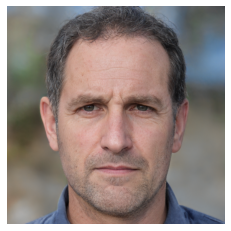

Seed 2


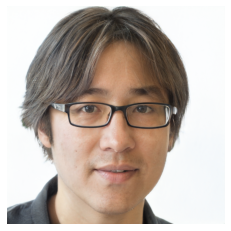

Seed 3


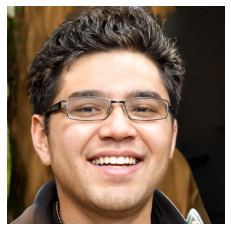

Seed 4


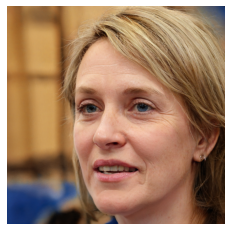

Seed 5


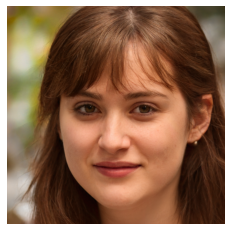

Seed 6


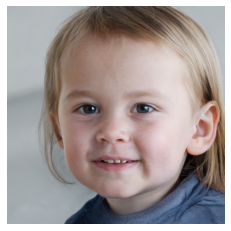

Seed 7


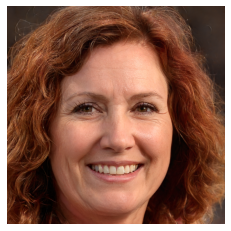

Seed 8


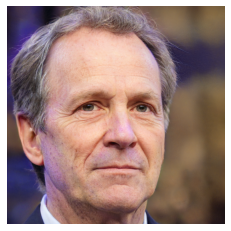

Seed 9


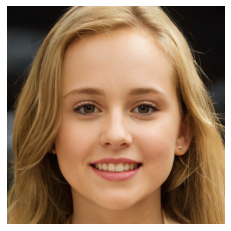

Seed 10


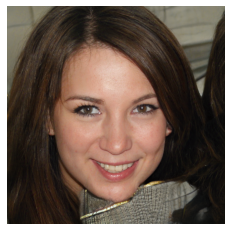

Seed 11


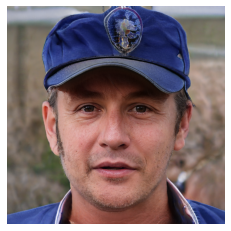

Seed 12


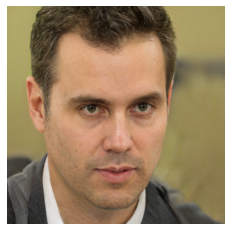

Seed 13


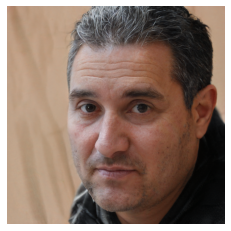

Seed 14


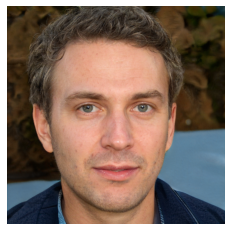

Seed 15


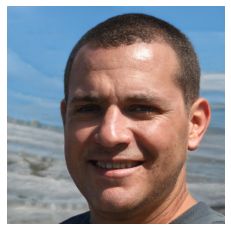

Seed 16


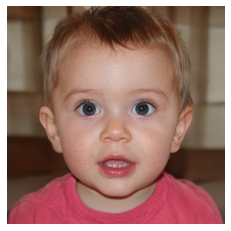

Seed 17


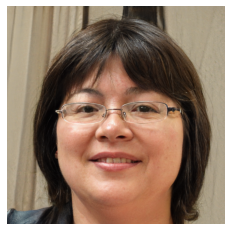

Seed 18


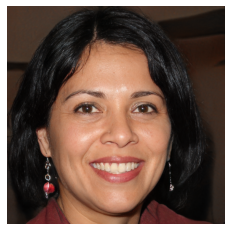

Seed 19


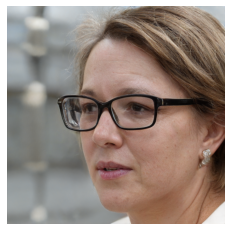

Seed 20


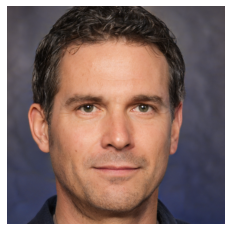

Seed 21


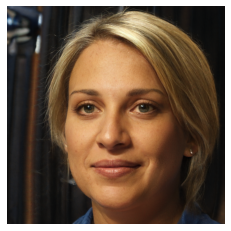

Seed 22


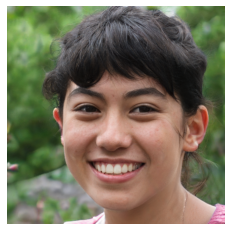

Seed 23


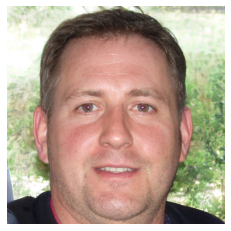

Seed 24


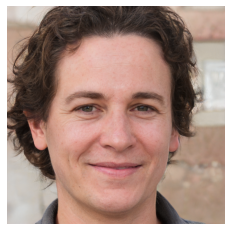

Seed 25


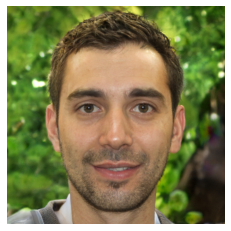

Seed 26


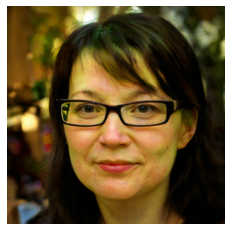

Seed 27


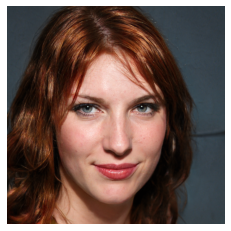

Seed 28


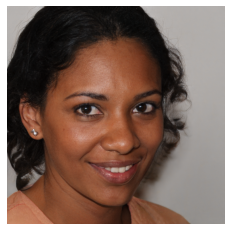

Seed 29


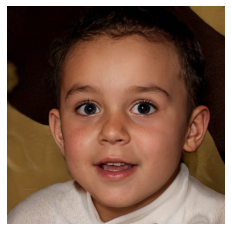

Seed 30


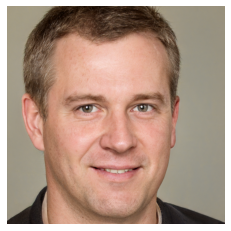

Seed 31


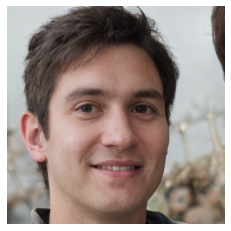

Seed 32


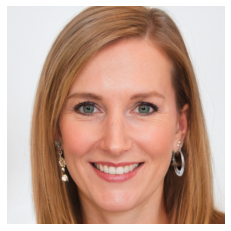

Seed 33


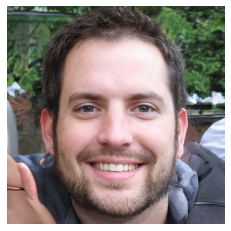

Seed 34


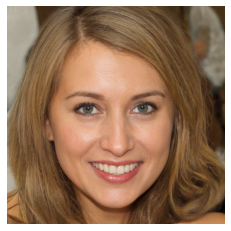

Seed 35


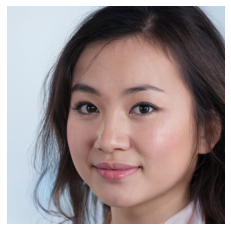

Seed 36


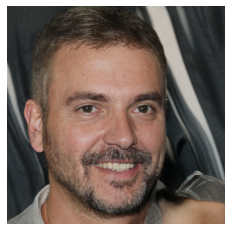

Seed 37


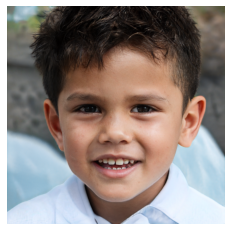

Seed 38


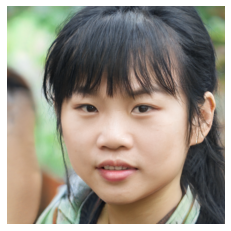

Seed 39


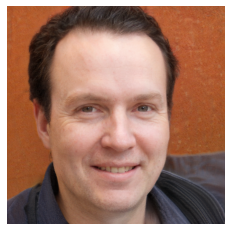

Seed 40


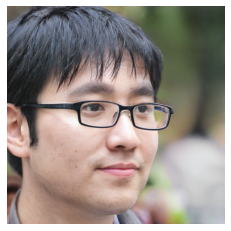

Seed 41


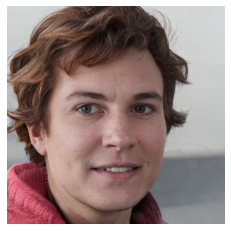

Seed 42


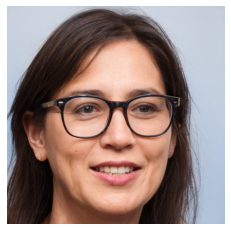

Seed 43


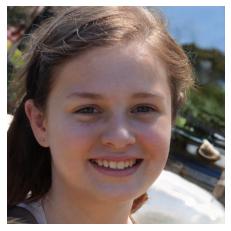

Seed 44


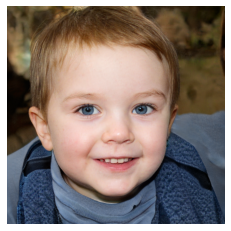

Seed 45


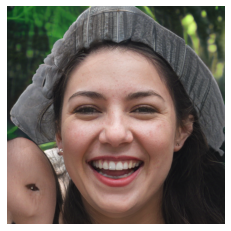

Seed 46


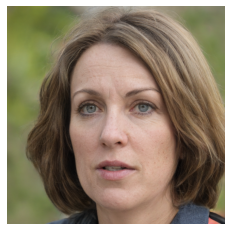

Seed 47


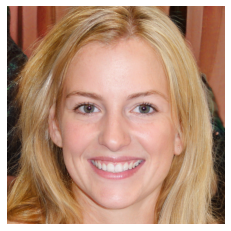

Seed 48


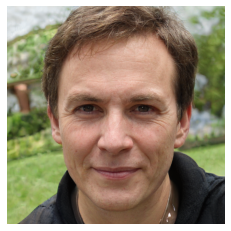

Seed 49


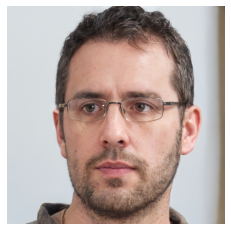

Seed 50


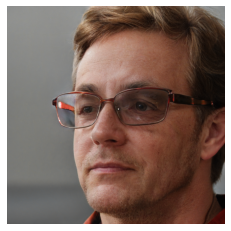

Seed 51


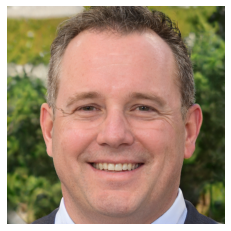

Seed 52


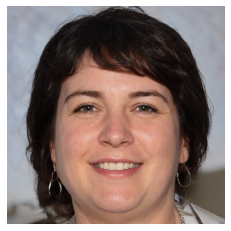

Seed 53


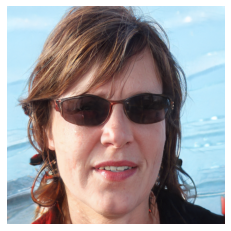

Seed 54


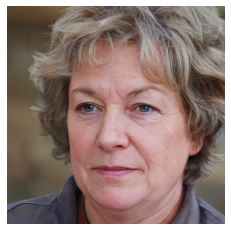

Seed 55


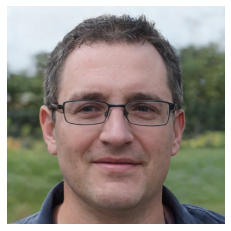

Seed 56


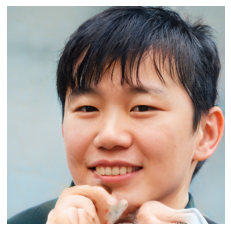

Seed 57


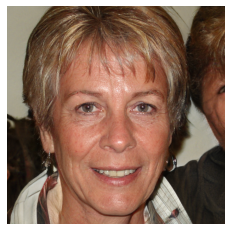

Seed 58


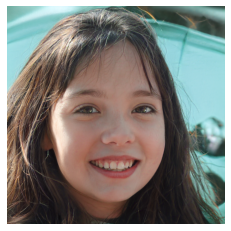

Seed 59


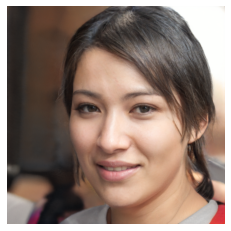

Seed 60


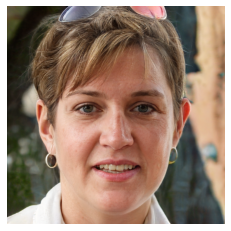

Seed 61


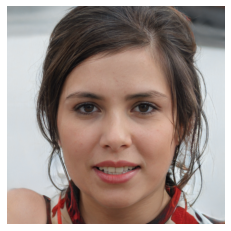

Seed 62


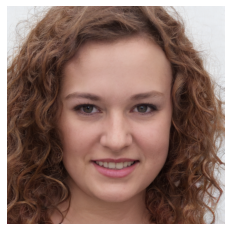

Seed 63


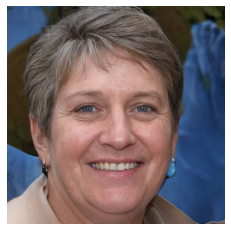

Seed 64


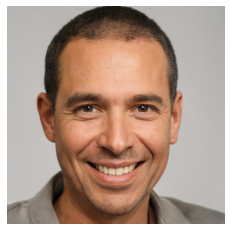

Seed 65


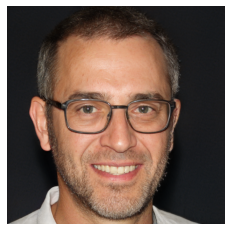

Seed 66


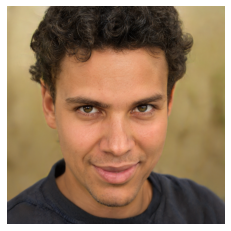

Seed 67


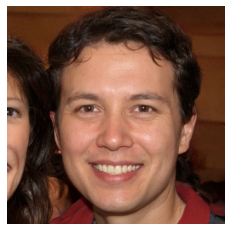

Seed 68


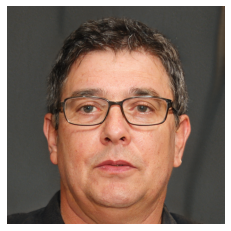

Seed 69


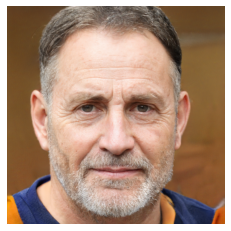

Seed 70


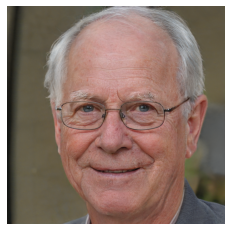

Seed 71


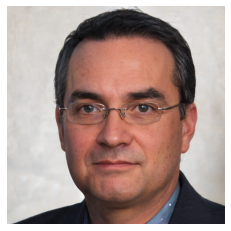

Seed 72


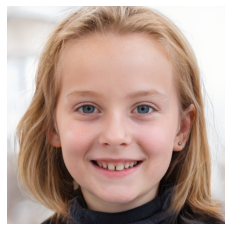

Seed 73


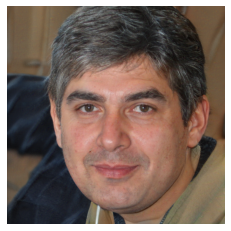

Seed 74


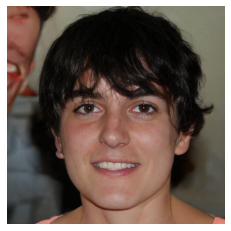

Seed 75


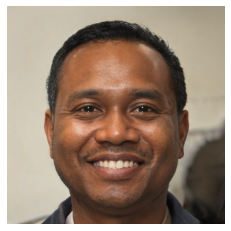

Seed 76


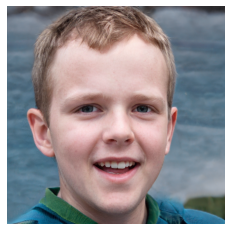

Seed 77


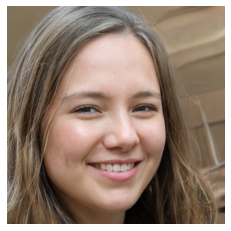

Seed 78


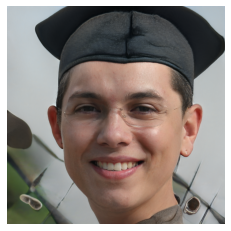

Seed 79


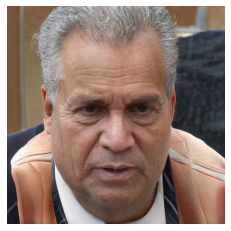

Seed 80


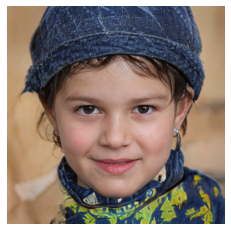

Seed 81


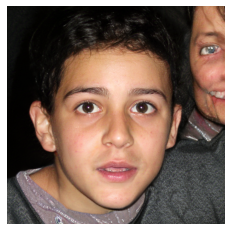

Seed 82


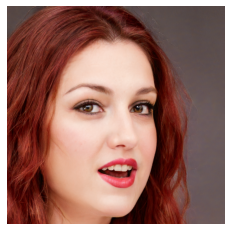

Seed 83


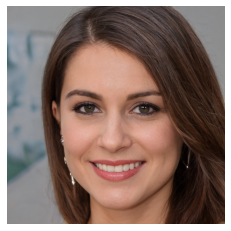

Seed 84


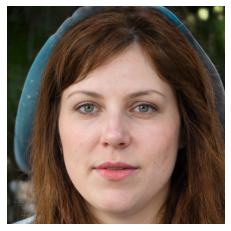

Seed 85


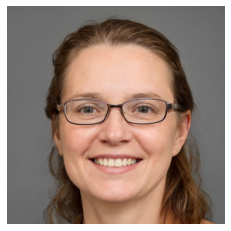

Seed 86


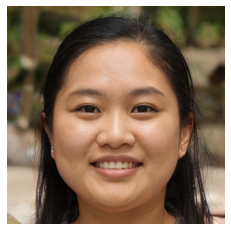

Seed 87


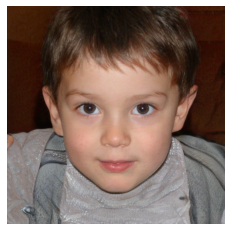

Seed 88


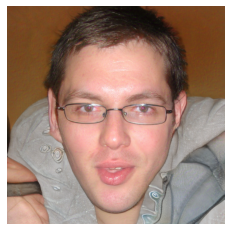

Seed 89


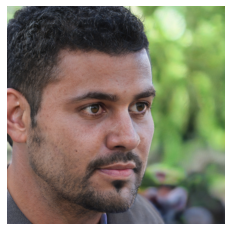

Seed 90


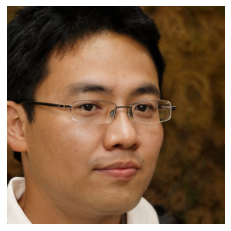

Seed 91


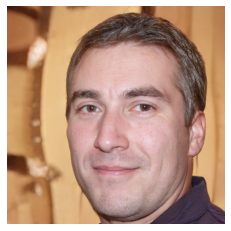

Seed 92


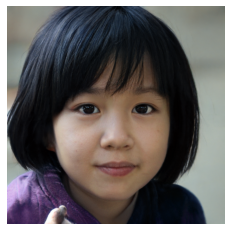

Seed 93


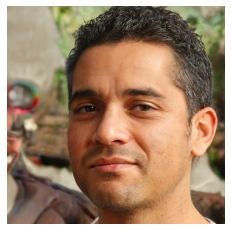

Seed 94


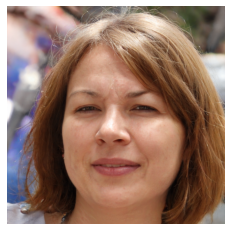

Seed 95


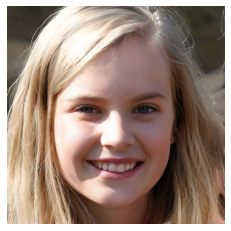

Seed 96


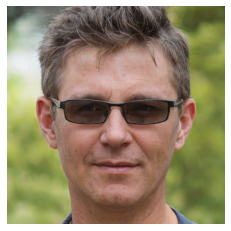

Seed 97


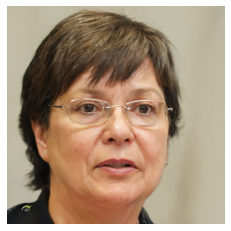

Seed 98


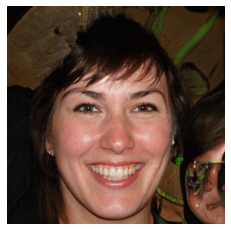

Seed 99


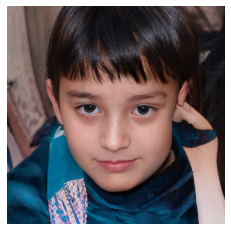

In [106]:
# Choose your own starting and ending seed.
SEED_FROM = 1
SEED_TO = 100
import cv2 
#import matplotlib.pyplot as plt

import skimage.io
import numpy as np

from matplotlib import pyplot as plt


# Generate the images for the seeds.
for i in range(SEED_FROM, SEED_TO):
  print(f"Seed {i}")
  init_random_state(Gs, 10)
  z = seed2vec(Gs, i)
  img = generate_image(Gs, z, 0.7)
  display_image(img)
  #cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  cv2.imwrite('/content/drive/MyDrive/generated_image/'+str(i)+'.png',cv2.cvtColor(img, cv2.COLOR_RGB2BGR))



In [70]:
img.shape

(1024, 1024, 3)